In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.signal import correlate2d
import cv2
from scipy import signal
# import tensorflow as tf
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score, mean_squared_error
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf

In [4]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1714 entries, 0 to 1713
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   label         1714 non-null   int64  
 1   latitude      1714 non-null   float64
 2   longitude     1714 non-null   float64
 3   year          1714 non-null   int64  
 4   example_path  1714 non-null   object 
dtypes: float64(2), int64(2), object(1)
memory usage: 67.1+ KB


Thankfully no Nulls in data.
Below heatmaps for Geospatial density

In [6]:
fig = px.density_heatmap(train_df, x="longitude", y="latitude", marginal_x="histogram", marginal_y="histogram", width=700, height=700, nbinsx=100, nbinsy=100)
fig.show(filename='basic-line')

In [7]:
fig = px.density_heatmap(test_df, x="longitude", y="latitude", marginal_x="histogram", marginal_y="histogram", width=700, height=700, nbinsx=100, nbinsy=100)
fig.show(filename='basic-line')

In [8]:
fig = px.scatter_mapbox(train_df,
                        lat="latitude",
                        lon="longitude",
                        zoom=4,
                        color="label",
                        height=900,
                        width=1300)
fig.update_layout(mapbox_style='carto-positron')
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

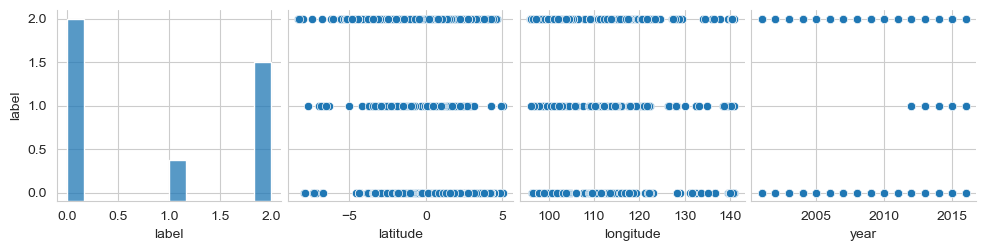

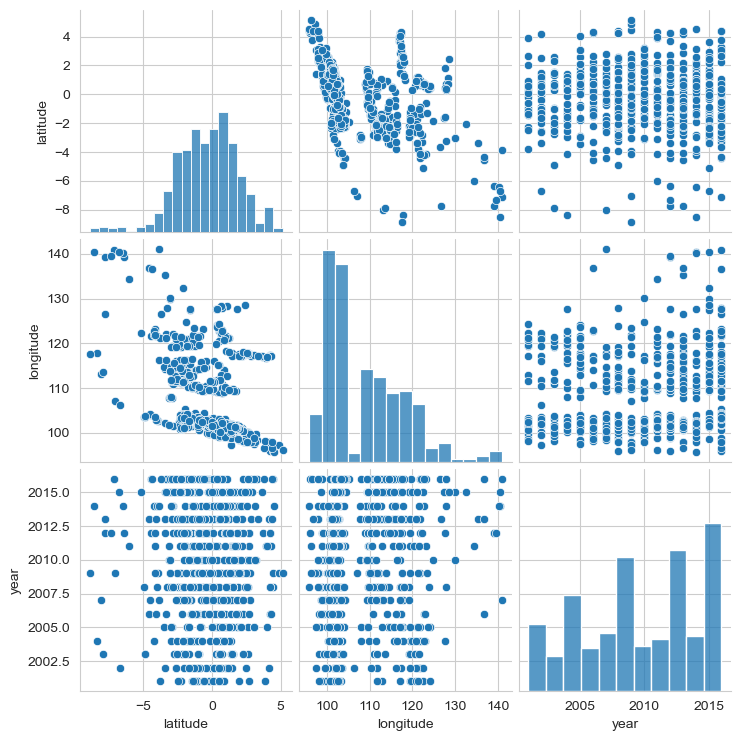

In [9]:
sns.pairplot(train_df, y_vars='label')
sns.pairplot(test_df)

Checking if labels are correlated to lat/long

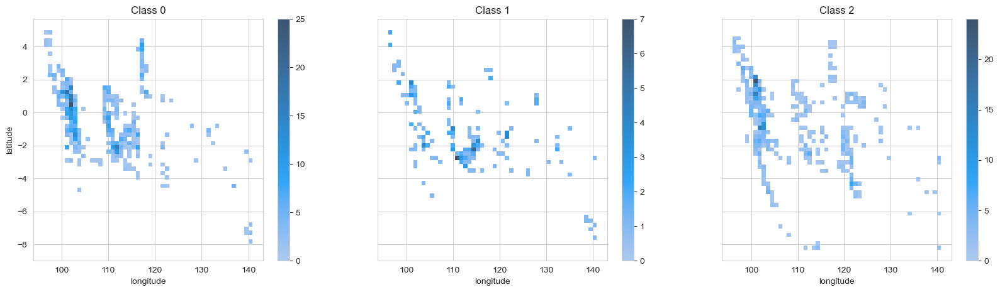

In [10]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
n_labels = len(np.unique(train_df['label']))
for index, label in enumerate(np.unique(train_df['label'])):
    data_ = train_df[train_df['label']==label]
    title = 'Class ' + str(int(label))
    sns.histplot(data=data_, x="longitude", y="latitude", cbar=True, bins=50, ax=axes[index]).set(title=title)
plt.show()

Checking if train/test split is proper

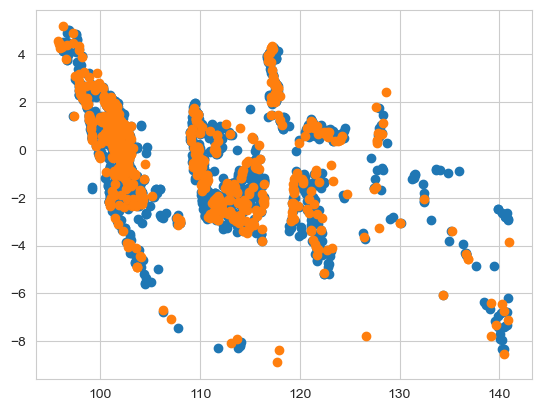

In [11]:
plt.scatter(train_df['longitude'], train_df['latitude'])
plt.scatter(test_df['longitude'], test_df['latitude'])
plt.show()

Equalizing histograms for y_CrCb and HSV color space

In [12]:
def hisEqulColor(img):
    ycrcb=cv2.cvtColor(img,cv2.COLOR_BGR2YCR_CB)
    channels=cv2.split(ycrcb)
    hist = cv2.equalizeHist(channels[0])
    ycrcb = cv2.merge((hist,  channels[1], channels[2]))
    img = cv2.cvtColor(ycrcb,cv2.COLOR_YCR_CB2BGR)
    return img

def hisEqulColorHSV(img):
    hsv=cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    channels=cv2.split(hsv)
    hist = cv2.equalizeHist(channels[2])
    hsv = cv2.merge((channels[0],  channels[1], hist))
    img = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
    return img

Combining 2 Sobel filters

In [13]:
def combined_filter(img, mask1, mask2):
    conv1 = np.zeros(img.shape)
    conv2 = np.zeros(img.shape)
    for i in range(3):
        conv1[:, :, i] = signal.convolve2d(img[:, :, i], mask1, mode='same', boundary='symm')
        conv2[:, :, i] = signal.convolve2d(img[:, :, i], mask2, mode='same', boundary='symm')
    return np.sqrt(conv1**2 + conv2**2)

In [14]:
sep_classes = [train_df[train_df['label']==0], train_df[train_df['label']==1], train_df[train_df['label']==2]]

In [15]:
s1 = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
s2 = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])

In [16]:
def edge_rec(class_n):
    n_pics = 4
    paths = sep_classes[class_n]['example_path'].sample(n_pics).to_list()
    fig, ax = plt.subplots(n_pics, 5)
    fig.set_size_inches(15,12)
    for i, path in enumerate(paths):
        img_ = cv2.imread(path)
        img_ycrcb = hisEqulColor(img_)
        img_hsv = hisEqulColorHSV(img_)
        ax[i, 0].imshow(img_)
        ax[i, 1].imshow(img_ycrcb)
        ax[i, 2].imshow(img_hsv)
        ax[i, 3].imshow(combined_filter(img_ycrcb/255,s1,s2))
        ax[i, 4].imshow(combined_filter(img_hsv/255,s1,s2))
    plt.show()

Seeing how filters work on different classes

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


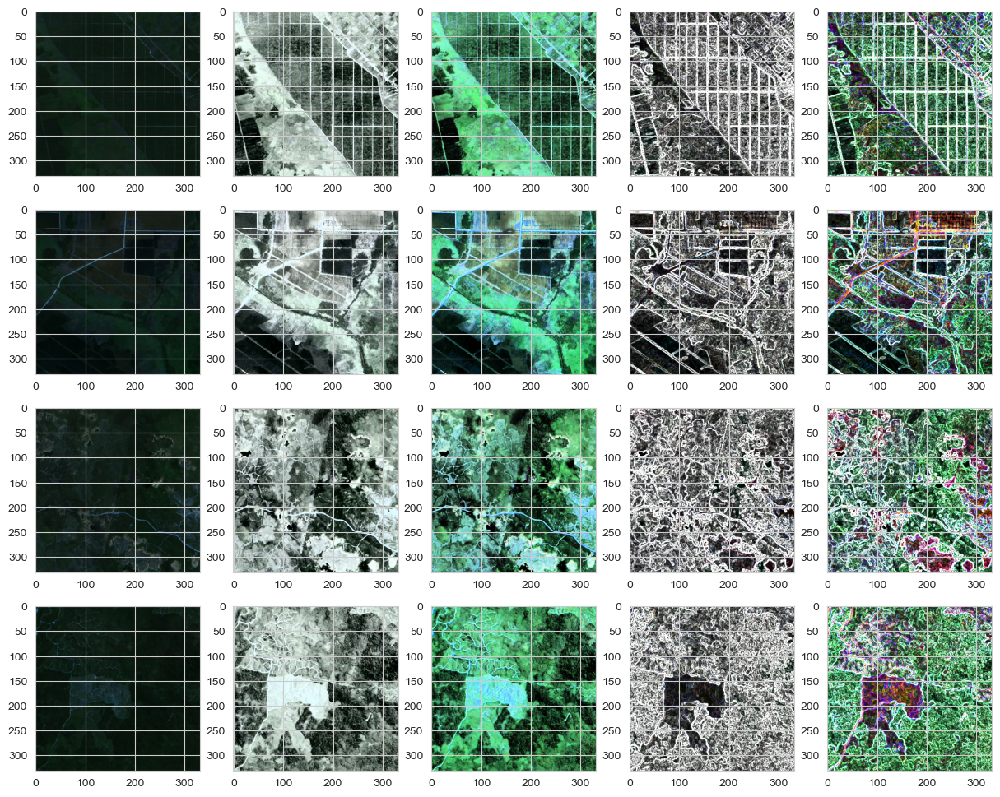

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


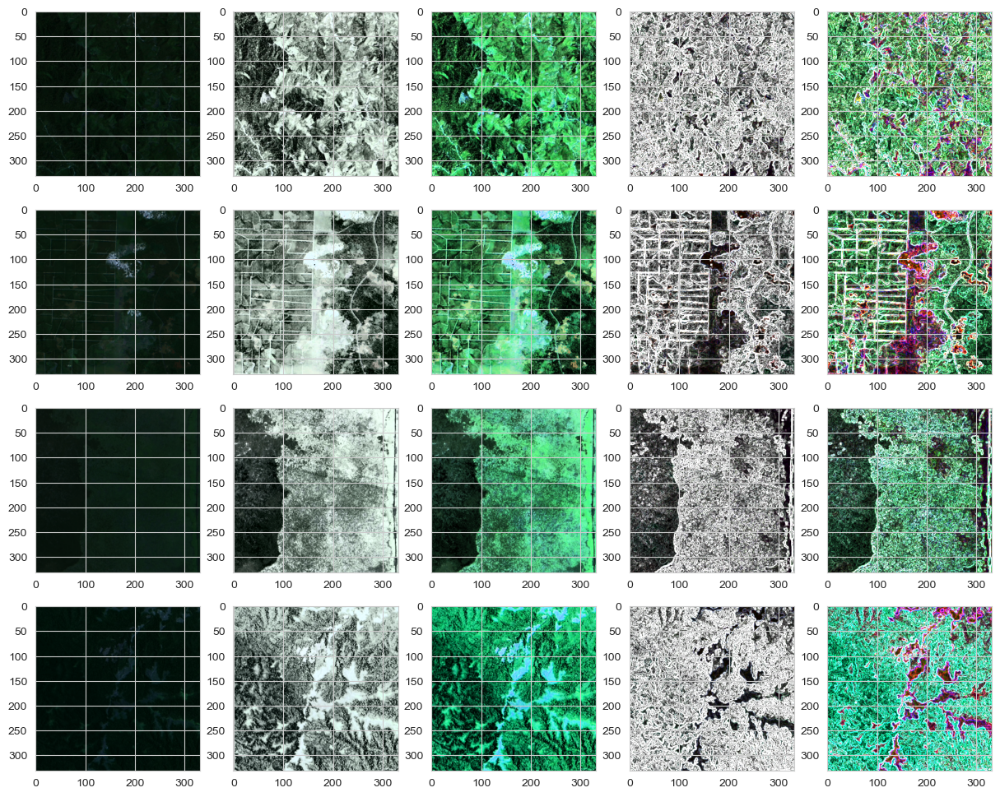

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


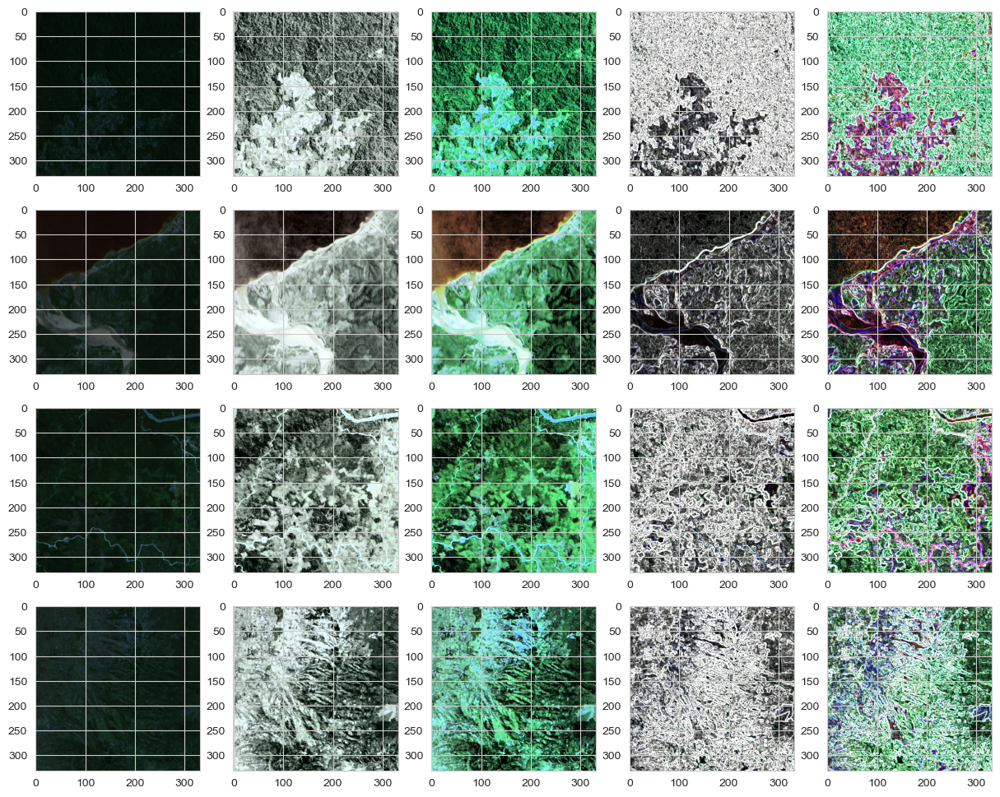

In [17]:
edge_rec(0)
edge_rec(1)
edge_rec(2)

Preparing data for some simple naive models

In [18]:
y = np.array(train_df['label']).reshape(-1,1)

In [19]:
X = np.array(train_df[['latitude','longitude']])

In [20]:
x_train, x_test, y_train, y_test = train_test_split(X, y,test_size=0.2,random_state=42)

In [21]:
tree_depth = 3
tree_clf = DecisionTreeClassifier(max_depth=tree_depth, random_state=42)
tree_clf.fit(x_train,y_train)

f1tr = f1_score(y_train,tree_clf.predict(x_train), average='weighted')
f1te = f1_score(y_test,tree_clf.predict(x_test), average='weighted')
acctr = accuracy_score(y_train,tree_clf.predict(x_train))
accte = accuracy_score(y_test,tree_clf.predict(x_test))

print(f1tr, f1te, acctr, accte)

0.5987245070476322 0.5283517889234677 0.6345733041575492 0.5743440233236151


In [22]:
rnd_clf = RandomForestClassifier(n_estimators=10)
rnd_clf.fit(x_train,y_train)

f1tr = f1_score(y_train,rnd_clf.predict(x_train), average='weighted')
f1te = f1_score(y_test,rnd_clf.predict(x_test), average='weighted')
acctr = accuracy_score(y_train,rnd_clf.predict(x_train))
accte = accuracy_score(y_test,rnd_clf.predict(x_test))

print(f1tr, f1te, acctr, accte)

0.9744028707374333 0.6278444960149925 0.9744711889132021 0.6326530612244898


In [23]:
gbc_clf = GradientBoostingClassifier(n_estimators=10)
gbc_clf.fit(x_train,y_train)

f1tr = f1_score(y_train,gbc_clf.predict(x_train), average='weighted')
f1te = f1_score(y_test,gbc_clf.predict(x_test), average='weighted')
acctr = accuracy_score(y_train,gbc_clf.predict(x_train))
accte = accuracy_score(y_test,gbc_clf.predict(x_test))

print(f1tr, f1te, acctr, accte)

0.6188964255001427 0.5457773839448549 0.6549963530269876 0.5918367346938775


Read in train pictures

In [24]:
image_paths_per_class = train_df.groupby("label")["example_path"].apply(list).to_dict()
images_per_class = {
    label: [cv2.imread(path) for path in paths]
    for label, paths in image_paths_per_class.items()
}

Let's see the distribution of classes

In [25]:
{label: len(images) for label, images in images_per_class.items()}

{0: 860, 1: 196, 2: 658}

We will need to augment the data in order to make every class representative

Read in test pictures

In [ ]:
test_pictures_paths = test_df["example_path"].tolist()
test_images = [cv2.imread(path) for path in test_pictures_paths]


Preprocess data using hsv

In [ ]:
def preprocess_picture(img):
    img_hsv_normalized = hisEqulColorHSV(img)
    filtered_hsv = combined_filter(img_hsv_normalized/255,s1,s2)
    return filtered_hsv

Preprocessing data

In [ ]:
preprocessed_test_images = [preprocess_picture(img) for img in test_images]

In [ ]:
preproccesed_train_images = {
    label: [preprocess_picture(img) for img in class_images]
    for label, class_images in images_per_class.items()
}

In [ ]:
plt.imshow(preprocessed_test_images[100])
plt.show()

Converting data to tensors

In [ ]:
train_labels, train_data = [], []
for label, pictures in preproccesed_train_images.items():
    class_size = len(pictures)
    label_tensor = [label] * class_size
    data_tensor = tf.convert_to_tensor(pictures)
    train_labels.extend(label_tensor)
    train_data.append(data_tensor)

labels = tf.one_hot(train_labels, 3)
train_data = tf.convert_to_tensor(np.concatenate(train_data))

As we have seen previously the data need to be augmented

Defining model